<a href="https://colab.research.google.com/github/MikeinWang/11-6/blob/main/openpose.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


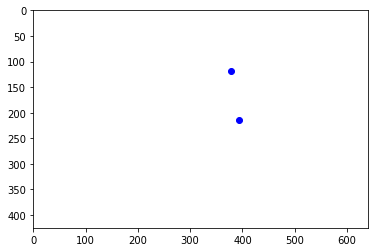

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

paf_sigma = 8         # 肢体宽度
shape = (425, 640, 3) # 图像大小
joint_from = np.array([378, 118]) # 肢体的两个点
joint_to = np.array([393,  214])

plt.xlim((0,shape[1]))
plt.ylim((0,shape[0]))
plt.scatter([joint_from[0], joint_to[0]], [joint_from[1], joint_to[1]], color='b')
plt.gca().invert_yaxis() # 将plt的原点由坐下设置为左上


vertical_unit_vector =  [ 0.98801203 -0.15437688]


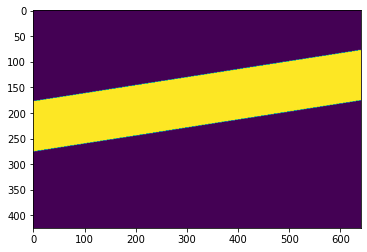

In [ ]:
joint_distance = np.linalg.norm(joint_to - joint_from)   #计算膜
unit_vector = (joint_to - joint_from) / joint_distance   #计算单位向量     
rad = np.pi / 2
rot_matrix = np.array([[np.cos(rad), np.sin(rad)], [-np.sin(rad), np.cos(rad)]])
# print("垂直分量 = ", np.dot(rot_matrix,(joint_to - joint_from) ))
vertical_unit_vector = np.dot(rot_matrix, unit_vector)  # 垂直分量
print("vertical_unit_vector = ", vertical_unit_vector)

grid_x = np.tile(np.arange(shape[1]), (shape[0], 1))
grid_y = np.tile(np.arange(shape[0]), (shape[1], 1)).transpose()  # grid_x, grid_y用来遍历图上的每一个点

horizontal_inner_product = unit_vector[0] * (grid_x - joint_from[0]) + unit_vector[1] * (grid_y - joint_from[1])
horizontal_paf_flag = (0 <= horizontal_inner_product) & (horizontal_inner_product <= joint_distance)
plt.imshow(horizontal_paf_flag)


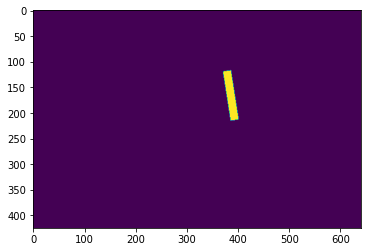

In [ ]:
vectemp = vertical_unit_vector # 垂直分量
# 求图像上点到线之间的距离 = 图像上的向量与垂直向量的点乘

vertical_inner_product = vectemp[0] * (grid_x - joint_from[0]) + vectemp[1] * (grid_y - joint_from[1])
vertical_paf_flag = np.abs(vertical_inner_product) <= paf_sigma  # paf_width : 8
paf_flag = horizontal_paf_flag & vertical_paf_flag  # 合并两个限制条件
plt.imshow(paf_flag)


In [ ]:
# constant_paf.shape : (2, 368, 368), 上面这一步就是把2维的unit_vector broadcast到所有paf_flag为true的点上去
# constant_paf里面有368*368个点，每个点上有两个值，代表一个矢量
# constant_paf里的这些矢量只会取两种值，要么是(0,0),要么是unit_vector的值
print(unit_vector)
np.broadcast_to(unit_vector , shape[:-1] + (2,))
print(np.broadcast_to(unit_vector , shape[:-1] + (2,)).shape)
paf_flag = paf_flag + 0
constant_paf = np.stack((paf_flag, paf_flag)) * np.broadcast_to(unit_vector, shape[:-1] + (2,)).transpose(2, 0, 1)
# plt.show(constant_paf[0])
print(constant_paf.shape)
print(constant_paf[0].shape)
print(constant_paf[0][119, 379]) # 得到单位向量X=0.1543768802736096
print(constant_paf[1][119, 379]) # 得到单位向量y=0.9880120337511015


[0.15437688 0.98801203]
(425, 640, 2)
(2, 425, 640)
(425, 640)
0.1543768802736096
0.9880120337511015


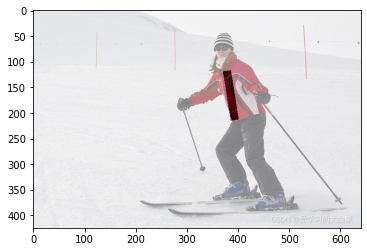

In [ ]:
import cv2
bgr_image = cv2.imread("/content/drive/MyDrive/deeplearning/photoski.jpeg")
rgb_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)
heatmap = constant_paf[0]
heatmap = cv2.normalize(heatmap, heatmap, 0, 255, cv2.NORM_MINMAX)
heatmap = np.uint8(heatmap)
jetmap = cv2.applyColorMap(255-heatmap, cv2.COLORMAP_PINK)

alpha = 0.5
out = cv2.addWeighted(rgb_image, alpha, jetmap, 1 - alpha, 0, jetmap)
plt.imshow(out)

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm as c

bgr_image = cv2.imread("/content/drive/MyDrive/deeplearning/photoski.jpeg")
rgb_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)

#18 KEYPOINTS
points = [[367,  81,  2],
          [378, 118,   2],
          [358, 129,   2],
          [341, 159,   2],
          [309, 178,   2],
          [399, 108,   2],
          [433, 142,   2],
          [449, 165,   2],
          [393, 214,   2],
          [367, 273,   2],
          [396, 341,   2],
          [424, 203,   2],
          [429, 294,  2],
          [466, 362,   2],
          [360,  75,   2],
          [374,  73,   2],
          [356,  81,   2],
          [386,  78,   2]]


In [ ]:
def generate_gaussian_heatmap(shape, joint, sigma):
    x, y,_ = joint 
    print(x,y)
    grid_x = np.tile(np.arange(shape[1]), (shape[0], 1))
    grid_y = np.tile(np.arange(shape[0]), (shape[1], 1)).transpose()
    grid_distance = (grid_x - x) ** 2 + (grid_y - y) ** 2
    gaussian_heatmap = np.exp(-0.5 * grid_distance / sigma ** 2)
    # 产生的就是一整张图的gaussian分布，只不过里中心点远的点非常非常小
    return gaussian_heatmap



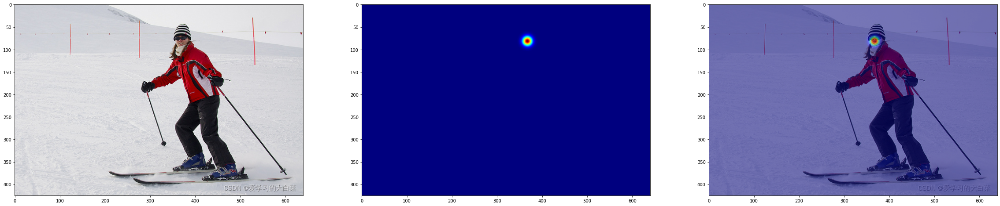

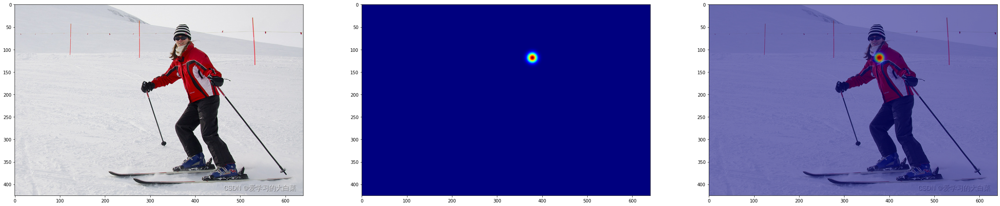

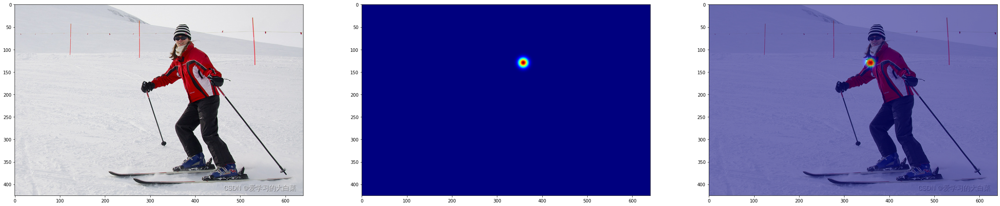

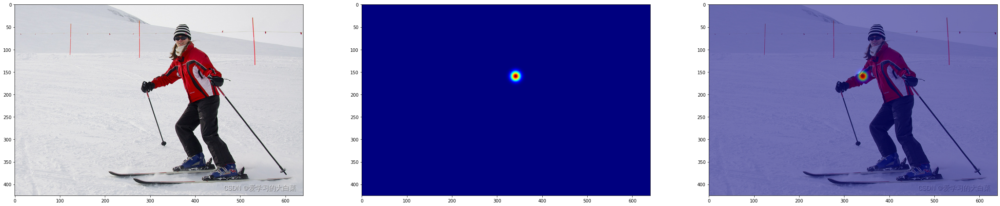

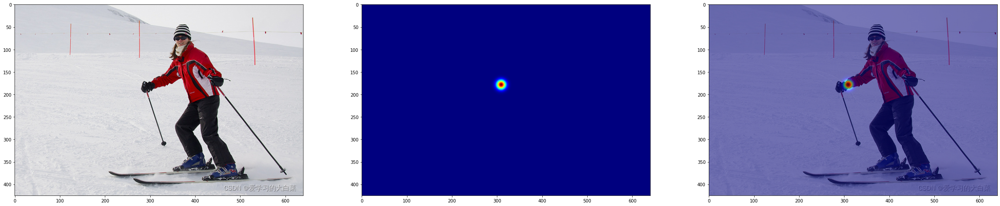

...

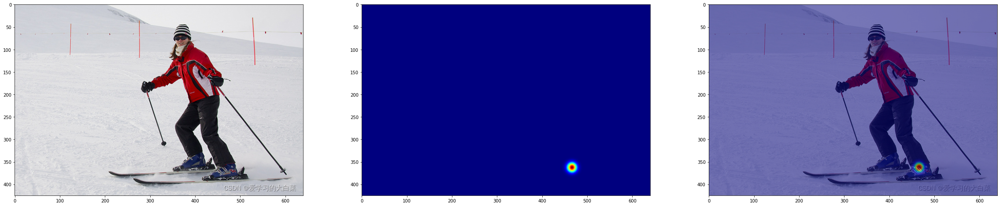

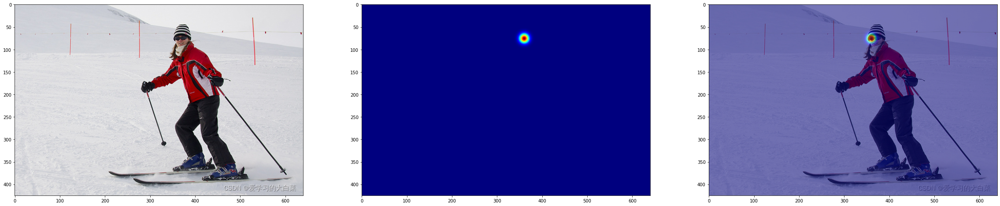

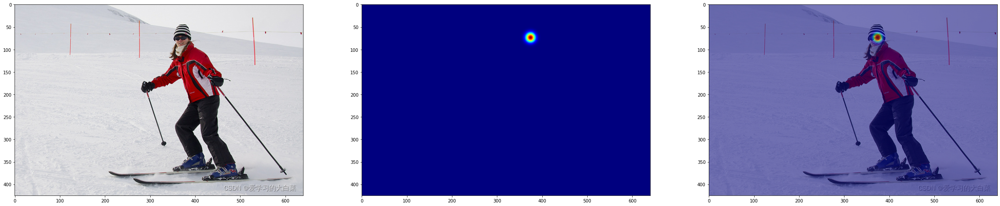

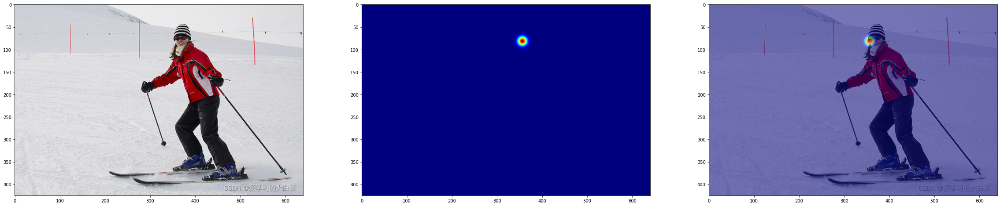

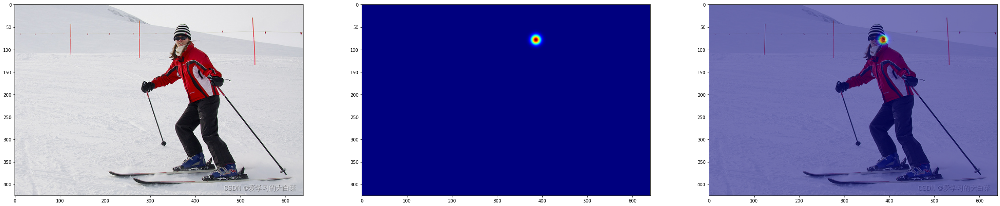

In [ ]:
for point in points:
    guss_heatmap = generate_gaussian_heatmap(rgb_image.shape, point, sigma = 7)
    fg, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(40, 8))

    ax1.imshow(rgb_image)
    ax2.imshow(guss_heatmap, cmap=c.jet)

    guss_heatmap[guss_heatmap < 0] = 0
    guss_heatmap = cv2.normalize(guss_heatmap, guss_heatmap, 0, 255, cv2.NORM_MINMAX)
    guss_heatmap = np.uint8(guss_heatmap)
    jetmap = cv2.applyColorMap(255-guss_heatmap, cv2.COLORMAP_JET)
    alpha = 0.5
    out = cv2.addWeighted(rgb_image, alpha, jetmap, 1 - alpha, 0, jetmap)
    ax3.imshow(out, cmap=c.jet)

In [ ]:
generate_gaussian_heatmap(rgb_image.shape, point, sigma = 7)

array([[0.00000000e+000, 0.00000000e+000, 0.00000000e+000, ...,
        6.99114227e-307, 4.12539215e-309, 2.38516915e-311],
       [0.00000000e+000, 0.00000000e+000, 0.00000000e+000, ...,
        3.39971470e-306, 2.00613231e-308, 1.15988122e-310],
       [0.00000000e+000, 0.00000000e+000, 0.00000000e+000, ...,
        1.61984573e-305, 9.55852219e-308, 5.52643031e-310],
       ...,
       [0.00000000e+000, 0.00000000e+000, 0.00000000e+000, ...,
        0.00000000e+000, 0.00000000e+000, 0.00000000e+000],
       [0.00000000e+000, 0.00000000e+000, 0.00000000e+000, ...,
        0.00000000e+000, 0.00000000e+000, 0.00000000e+000],
       [0.00000000e+000, 0.00000000e+000, 0.00000000e+000, ...,
        0.00000000e+000, 0.00000000e+000, 0.00000000e+000]])